In [16]:
import pandas as pd
import pyodbc
import pandas.io.sql as psql

In [17]:
cnxn = pyodbc.connect("Driver={SQL Server Native Client 11.0};"
                      "Server=DESKTOP-RS8GHJ8\SQLEXPRESS;"
                      "Database=Olist;"
                      "Trusted_Connection=yes; MARS_Connection=Yes;")

In [18]:
sqlString = """\
    SELECT 
        [Olist].[dbo].[CustomerLocationView].[customer_id]
        , [Olist].[dbo].[CustomerLocationView].[customer_unique_id]
        , [Olist].[dbo].[CustomerLocationView].[customer_zip_code_prefix]
        , [Olist].[dbo].[CustomerLocationView].[customer_city]
        , [Olist].[dbo].[CustomerLocationView].[customer_state]
        , [geolocation_lng] AS [customer_geolocation_lng]
        , [geolocation_lat] AS [customer_geolocation_lat]
        , [dbo].[olist_orders_dataset].order_id
        , [dbo].[olist_orders_dataset].order_status
        , CAST([dbo].[olist_orders_dataset].order_purchase_timestamp AS DATETIME) AS order_purchase_timestamp
        , CAST([dbo].[olist_orders_dataset].order_approved_at AS DATETIME) AS order_approved_at
        , CAST([dbo].[olist_orders_dataset].order_delivered_carrier_date AS DATETIME) AS order_delivered_carrier_date
        , CAST([dbo].[olist_orders_dataset].order_delivered_customer_date AS DATETIME) AS order_delivered_customer_date
        , CAST([dbo].[olist_orders_dataset].order_estimated_delivery_date AS DATETIME) AS order_estimated_delivery_date
        , CAST([dbo].[olist_order_items_dataset].[order_item_id] AS INT) AS [order_item_id]
        , CAST([dbo].[olist_order_items_dataset].[shipping_limit_date] AS DATETIME) AS [shipping_limit_date]
        , CAST([dbo].[olist_order_items_dataset].[price] AS FLOAT) AS [price]
        , CAST([dbo].[olist_order_items_dataset].[freight_value] AS FLOAT) AS [freight_value]
        , [dbo].[SellersLocationView].[seller_id]
        , [dbo].[SellersLocationView].[seller_zip_code_prefix]
        , [dbo].[SellersLocationView].[seller_city]
        , [dbo].[SellersLocationView].[seller_state]
        , [dbo].[SellersLocationView].[geolocation_lng] AS [seller_geolocation_lng]
        , [dbo].[SellersLocationView].[geolocation_lat] AS [seller_geolocation_lat]
        , [dbo].[olist_products_dataset].product_id
        , [dbo].[product_category_name_translation].product_category_name_english
        , CAST([dbo].[olist_products_dataset].product_name_lenght AS FLOAT) AS product_name_lenght
        , CAST([dbo].[olist_products_dataset].product_description_lenght AS FLOAT) AS product_description_lenght
        , CAST([dbo].[olist_products_dataset].product_photos_qty AS FLOAT) AS product_photos_qty
        , CAST([dbo].[olist_products_dataset].product_weight_g AS FLOAT) AS product_weight_g
        , CAST([dbo].[olist_products_dataset].product_length_cm AS FLOAT) AS product_length_cm
        , CAST([dbo].[olist_products_dataset].product_height_cm AS FLOAT) AS product_height_cm
        , CAST([dbo].[olist_products_dataset].product_width_cm AS FLOAT) AS product_width_cm 
        , CAST([dbo].[olist_order_payments_dataset].payment_sequential AS FLOAT) AS payment_sequential 
        , [dbo].[olist_order_payments_dataset].payment_type
        , CAST([dbo].[olist_order_payments_dataset].payment_installments AS FLOAT) AS payment_installments 
        , CAST([dbo].[olist_order_payments_dataset].payment_value AS FLOAT) AS payment_value
        , [review_id]
        , [review_score]
        , [review_comment_title]
        , [review_comment_message]
        , [review_creation_date]
        , [review_answer_timestamp]
    FROM [Olist].[dbo].[CustomerLocationView]
    INNER JOIN [dbo].[olist_orders_dataset] ON [dbo].[olist_orders_dataset].customer_id = [Olist].[dbo].[CustomerLocationView].customer_id
    INNER JOIN [dbo].[olist_order_items_dataset] ON [dbo].[olist_order_items_dataset].order_id = [dbo].[olist_orders_dataset].order_id
    INNER JOIN [Olist].[dbo].[SellersLocationView] ON [Olist].[dbo].[SellersLocationView].seller_id = [dbo].[olist_order_items_dataset].seller_id
    INNER JOIN [dbo].[olist_products_dataset] ON [dbo].[olist_products_dataset].product_id = [dbo].[olist_order_items_dataset].product_id
    INNER JOIN [dbo].[product_category_name_translation] ON [dbo].[product_category_name_translation].product_category_name = [dbo].[olist_products_dataset].product_category_name
    INNER JOIN [dbo].[olist_order_payments_dataset] ON [dbo].[olist_order_payments_dataset].order_id = [dbo].[olist_orders_dataset].order_id
    LEFT JOIN [dbo].[olist_order_reviews_dataset] ON [dbo].[olist_order_reviews_dataset].[order_id] = [dbo].[olist_orders_dataset].order_id
"""

In [19]:
cursor = cnxn.cursor()
cursor.execute(sqlString)

df = psql.read_sql_query(sqlString, cnxn)

cursor.close()

In [20]:
df.head(10)

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,customer_geolocation_lng,customer_geolocation_lat,order_id,order_status,order_purchase_timestamp,...,payment_sequential,payment_type,payment_installments,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,"""8a2e7ef9053dea531e4dc76bd6d853e6""","""64190b91b656ab8f37eb89b93dc84584""","""13380""",nova odessa,SP,-45.880753,-23.235966,a548910a1c6147796b98fdf73dbeba33,delivered,2018-02-28 12:25:19,...,1.0,credit_card,1.0,88.09,80e641a11e56f04c1ad469d5645fdfde,5,,,2018-03-10,00:00:00;;;;;;;;;;;;;;;;;;
1,e226dfed6544df5b7b87a48208690feb,"""1d47144362c14e94ccdd213e8ec277d5""","""44571""",santo antonio de jesus,BA,-45.818479,-20.934634,f9e4b658b201a9f2ecdecbb34bed034b,delivered,2018-02-03 09:56:22,...,1.0,credit_card,1.0,194.12,228ce5500dc1d8e020d8d1322874b6f0,5,,,2018-02-17,00:00:00;;;;;;;;;;;;;;;;;;
2,eecafc3ff695f031bfe354a9fff9d437,bda84be75dfc9588ae63cfe827080b9b,"""01536""",sao paulo,SP,-47.653256,-22.692313,b18dcdf73be66366873cd26c5724d1dc,delivered,2018-04-06 22:18:54,...,1.0,credit_card,1.0,462.70,15197aa66ff4d0650b5434f1b46cda19,1,,,2018-04-13,00:00:00;;;;;;;;;;;;;;;;;;
3,eecafc3ff695f031bfe354a9fff9d437,bda84be75dfc9588ae63cfe827080b9b,"""01536""",sao paulo,SP,-47.653256,-22.692313,b18dcdf73be66366873cd26c5724d1dc,delivered,2018-04-06 22:18:54,...,1.0,credit_card,1.0,462.70,15197aa66ff4d0650b5434f1b46cda19,1,,,2018-04-13,00:00:00;;;;;;;;;;;;;;;;;;
4,eecafc3ff695f031bfe354a9fff9d437,bda84be75dfc9588ae63cfe827080b9b,"""01536""",sao paulo,SP,-43.957665,-19.833041,b18dcdf73be66366873cd26c5724d1dc,delivered,2018-04-06 22:18:54,...,1.0,credit_card,1.0,462.70,15197aa66ff4d0650b5434f1b46cda19,1,,,2018-04-13,00:00:00;;;;;;;;;;;;;;;;;;
5,eecafc3ff695f031bfe354a9fff9d437,bda84be75dfc9588ae63cfe827080b9b,"""01536""",sao paulo,SP,-47.653256,-22.692313,b18dcdf73be66366873cd26c5724d1dc,delivered,2018-04-06 22:18:54,...,1.0,credit_card,1.0,462.70,15197aa66ff4d0650b5434f1b46cda19,1,,,2018-04-13,00:00:00;;;;;;;;;;;;;;;;;;
6,"""840be0730010e9580efd289bc9f37706""",dcd4940b3f96a3e2b73d8f73387230cf,"""08412""",sao paulo,SP,-48.809349,-21.734663,e48aa0d2dcec3a2e87348811bcfdf22b,delivered,2017-06-30 15:38:46,...,1.0,credit_card,2.0,58.75,07f9bee5d1b850860defd761afa7ff16,5,,,2017-07-16,00:00:00;;;;;;;;;;;;;;;;;;
7,"""98f485515e575607a8003b17e91990bd""",c7b4fb0959a97e7033ff9bef3b1e2ba9,"""27521""",resende,RJ,-50.067913,-21.428935,c31a859e34e3adac22f376954e19b39d,delivered,2018-08-07 23:12:29,...,1.0,credit_card,3.0,198.96,7c6400515c67679fbee952a7525281ef,5,,,2018-08-14,00:00:00;;;;;;;;;;;;;;;;;;
8,a5224bdc7685fd39cd7a23404415493d,"""2bf6fd4ad93eb21b3d604481c48decbf""","""01306""",sao paulo,SP,-54.252211,-28.272303,b9bf720beb4ab3728760088589c62129,delivered,2018-05-14 10:29:02,...,1.0,credit_card,8.0,613.25,8670d52e15e00043ae7de4c01cc2fe06,4,recomendo,aparelho,eficiente.,no;;;;;;;;;;;;;;;;;;
9,"""272b46feddddc51904608ddd90feee33""","""485fa1b8db05ed6fa0062ece4ce80d2e""","""35180""",timoteo,MG,-46.714952,-23.575142,cdf9aa68e72324eeb25c7de974696ee2,delivered,2017-12-13 14:59:45,...,1.0,credit_card,1.0,136.99,c9cfd2d5ab5911836ababae136c3a10c,5,,,2017-12-23,00:00:00;;;;;;;;;;;;;;;;;;


In [21]:
df.columns

Index(['customer_id', 'customer_unique_id', 'customer_zip_code_prefix',
       'customer_city', 'customer_state', 'customer_geolocation_lng',
       'customer_geolocation_lat', 'order_id', 'order_status',
       'order_purchase_timestamp', 'order_approved_at',
       'order_delivered_carrier_date', 'order_delivered_customer_date',
       'order_estimated_delivery_date', 'order_item_id', 'shipping_limit_date',
       'price', 'freight_value', 'seller_id', 'seller_zip_code_prefix',
       'seller_city', 'seller_state', 'seller_geolocation_lng',
       'seller_geolocation_lat', 'product_id', 'product_category_name_english',
       'product_name_lenght', 'product_description_lenght',
       'product_photos_qty', 'product_weight_g', 'product_length_cm',
       'product_height_cm', 'product_width_cm', 'payment_sequential',
       'payment_type', 'payment_installments', 'payment_value', 'review_id',
       'review_score', 'review_comment_title', 'review_comment_message',
       'review_creati

In [22]:
df.shape

(112569, 43)

In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112569 entries, 0 to 112568
Data columns (total 43 columns):
customer_id                      112569 non-null object
customer_unique_id               112569 non-null object
customer_zip_code_prefix         112569 non-null object
customer_city                    112569 non-null object
customer_state                   112569 non-null object
customer_geolocation_lng         112569 non-null float64
customer_geolocation_lat         112569 non-null float64
order_id                         112569 non-null object
order_status                     112569 non-null object
order_purchase_timestamp         112569 non-null datetime64[ns]
order_approved_at                112569 non-null datetime64[ns]
order_delivered_carrier_date     112569 non-null datetime64[ns]
order_delivered_customer_date    112569 non-null datetime64[ns]
order_estimated_delivery_date    112569 non-null datetime64[ns]
order_item_id                    112569 non-null int64
shipping

In [24]:
df['order_purchase_timestamp'] = pd.to_datetime(df['order_purchase_timestamp'])
df['order_approved_at'] = pd.to_datetime(df['order_approved_at'])
df['order_delivered_carrier_date'] = pd.to_datetime(df['order_delivered_carrier_date'])
df['order_delivered_customer_date'] = pd.to_datetime(df['order_delivered_customer_date'])
df['order_estimated_delivery_date'] = pd.to_datetime(df['order_estimated_delivery_date'])
df['shipping_limit_date'] = pd.to_datetime(df['shipping_limit_date'])

df.to_csv('./datasets/olist_csv.csv', index=False)

In [14]:
pd.read_csv('./datasets/olist_csv.csv').shape

(112569, 37)

In [10]:
data = df.copy()

In [19]:
data['customer_geolocation_lng'] = data['customer_geolocation_lng'].astype(float)
data['customer_geolocation_lat'] = data['customer_geolocation_lat'].astype(float)

In [56]:
# import the library
import folium
import pandas as pd

# # Make a data frame with dots to show on the map
# data = pd.DataFrame({
#    'lat':[-58, 2, 145, 30.32, -4.03, -73.57, 36.82, -38.5],
#    'lon':[-34, 49, -38, 59.93, 5.33, 45.52, -1.29, -12.97],
#    'name':['Buenos Aires', 'Paris', 'melbourne', 'St Petersbourg', 'Abidjan', 'Montreal', 'Nairobi', 'Salvador'],
#    'value':[10,12,40,70,23,43,100,43]
# })

# Make an empty map
m = folium.Map(location=[20,0], tiles="Mapbox Bright", zoom_start=2)

# I can add circle one by one on the map
for i in range(0, len(data)):
    folium.Circle(
        location=[data.iloc[i]['geolocation_lat'], data.iloc[i]['geolocation_lng']]
        , radius=data.iloc[i]['CustomerCount'] * 10
        , color='crimson'
        , fill=True
        , fill_color='crimson'
    ).add_to(m)

# Save it as html
m

In [80]:
import folium
import pandas as pd
import numpy as np
from folium import plugins
from folium.plugins import HeatMap
import pprint

test = data

map_hooray = folium.Map()
heat_data = ()

def to_geocode(data):
    geo_code_df = pd.DataFrame(data)
    #return print(geo_code_df)
    heat_df = geo_code_df.dropna(axis=0, subset=['customer_geolocation_lat', 'customer_geolocation_lng'])
    heat_data = [[row['customer_geolocation_lat'],row['customer_geolocation_lng']] for index, row in heat_df.iterrows()]
    #Plot it on the map
    HeatMap(heat_data).add_to(map_hooray)
    return map_hooray

# map_hooray
to_geocode(test)

In [23]:
df['order_delivered_customer_date']

0         2018-02-25
1         2017-12-14
2         2018-01-03
3         2018-03-20
4         2017-10-16
5         2017-04-11
6         2017-04-18
7         2018-05-15
8         2017-06-02
9         2017-06-02
10        2017-06-02
11        2017-06-02
12        2017-06-02
13        2017-06-02
14        2018-08-14
15        2018-06-20
16        1900-01-01
17        2017-11-29
18        2017-06-05
19        2017-09-26
20        2017-11-01
21        2017-06-23
22        2018-06-28
23        2017-06-05
24        2018-06-05
25        2018-01-07
26        2017-12-22
27        2018-06-22
28        2017-04-18
29        2018-08-06
             ...    
112302    2017-03-15
112303    2017-03-15
112304    2017-03-15
112305    2018-01-30
112306    2017-06-21
112307    2018-01-31
112308    2018-03-06
112309    2018-03-06
112310    2018-03-15
112311    2018-08-16
112312    2017-06-16
112313    2018-01-09
112314    2017-11-22
112315    2017-05-26
112316    2017-12-11
112317    2018-08-13
112318    201

In [24]:
df['order_estimated_delivery_date']

0         2018-03-12
1         2017-12-21
2         2018-01-18
3         2018-04-12
4         2017-10-26
5         2017-04-25
6         2017-05-09
7         2018-06-13
8         2017-06-13
9         2017-06-13
10        2017-06-13
11        2017-06-13
12        2017-06-13
13        2017-06-13
14        2018-08-21
15        2018-07-05
16        2018-08-21
17        2017-12-12
18        2017-06-23
19        2017-10-13
20        2017-11-30
21        2017-07-20
22        2018-07-05
23        2017-06-21
24        2018-06-06
25        2018-01-04
26        2018-01-05
27        2018-06-29
28        2017-05-18
29        2018-08-20
             ...    
112302    2017-03-27
112303    2017-03-27
112304    2017-03-27
112305    2018-02-09
112306    2017-07-07
112307    2018-02-05
112308    2018-03-21
112309    2018-03-21
112310    2018-04-10
112311    2018-08-24
112312    2017-07-05
112313    2018-01-24
112314    2017-11-29
112315    2017-05-25
112316    2017-12-29
112317    2018-08-22
112318    201

In [36]:
df[df['order_delivered_customer_date'] - df['order_estimated_delivery_date'] > datetime.timedelta(days=0)] 

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,customer_geolocation_lng,customer_geolocation_lat,order_id,order_status,order_purchase_timestamp,...,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,payment_sequential,payment_type,payment_installments,payment_value
25,b257997a1becf344c617bb61240ad14f,aa55fd1328245d3aa3b2e7d76e04554d,"""48904""",juazeiro,BA,-46.612082,-23.625440,"""7e0f8681296df43a561897448828f476""",delivered,2017-12-05,...,751.0,3.0,150.0,17.0,4.0,12.0,1.0,credit_card,4.0,46.78
34,"""213083b940361e8f479171420a9a71eb""","""2d3e5076f14d42da578f63cec9644b9b""","""03161""",sao paulo,SP,-44.901870,-20.162004,"""49bb32cab29be3bbe1a0ae27978edb48""",delivered,2018-03-25,...,1142.0,1.0,19250.0,60.0,60.0,32.0,1.0,credit_card,2.0,504.09
56,ed8281fe17bd28cb00b79f98fba9c537,"""165fa6c178075605309f0f6a46ee6e04""","""29107""",vila velha,ES,-47.664701,-22.708702,f3c19ec2622d12aafeb4c32621b951b2,delivered,2017-12-13,...,184.0,1.0,1550.0,46.0,3.0,34.0,1.0,credit_card,5.0,137.99
63,"""02ed2cff54eb047cdbe79dd0535945d4""","""757921c3d0047781031e9bcbaf2c393c""","""05119""",sao paulo,SP,-48.829744,-21.757321,fb9b2930f4a30f96c7cc98eaaa85e5f0,delivered,2017-11-24,...,288.0,3.0,1200.0,39.0,30.0,39.0,1.0,credit_card,5.0,84.43
64,"""4e46d8da3f58d1c99839a534603f28b8""","""3e7ac88fcebf632fb01dd58bd3522ea6""","""56200""",ouricuri,PE,-46.564296,-23.661305,fb75871974a19244a87fcafde416f747,delivered,2018-04-02,...,2644.0,6.0,400.0,34.0,4.0,22.0,1.0,credit_card,8.0,366.27
79,"""61c2e2b154c006a3adc73f68f1df6fd9""","""741196e4796c95631b0ca9b42a2fc781""","""13610""",leme,SP,-48.829744,-21.757321,b300e160f5892169bafa006e670a43f5,delivered,2018-08-02,...,872.0,1.0,1400.0,45.0,15.0,35.0,1.0,credit_card,3.0,67.58
82,"""1a3e662389c7b8b69c4b59a8b07df75e""","""8945fdd252616652ec0fc1bd55d8c125""","""08598""",itaquaquecetuba,SP,-46.703699,-23.691093,"""2be14bfbd7aa00107ece493cbbcc29f0""",delivered,2017-11-16,...,903.0,6.0,2600.0,50.0,10.0,30.0,1.0,credit_card,3.0,176.16
83,"""1a3e662389c7b8b69c4b59a8b07df75e""","""8945fdd252616652ec0fc1bd55d8c125""","""08598""",itaquaquecetuba,SP,-46.703699,-23.691093,"""2be14bfbd7aa00107ece493cbbcc29f0""",delivered,2017-11-16,...,903.0,6.0,2600.0,50.0,10.0,30.0,1.0,credit_card,3.0,176.16
84,"""662b50538fbec2fa00feb3d4e7135b93""",bc0f16bc629417829deb3b163c25c510,"""53220""",olinda,PE,-46.632541,-23.590043,"""1436cba3294812a22fe0868db7581b68""",delivered,2017-12-12,...,801.0,5.0,100.0,16.0,4.0,14.0,1.0,boleto,1.0,36.62
90,fb4d778f6b01565f209b561c9928747b,"""01c1e31277120e8c6360c6448cbd4c80""","""63260""",brejo santo,CE,-47.812988,-15.882206,"""3a221cd6b7d813e2b6cf57339f37a062""",delivered,2018-02-05,...,240.0,1.0,150.0,35.0,8.0,11.0,1.0,credit_card,3.0,124.33


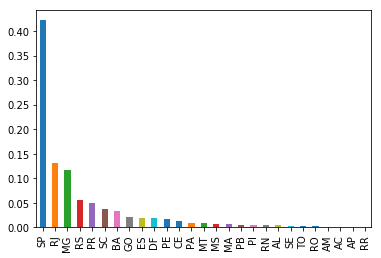

In [58]:
df['customer_state'].value_counts(normalize=True).plot(kind='bar');

In [41]:
df.columns

Index(['customer_id', 'customer_unique_id', 'customer_zip_code_prefix',
       'customer_city', 'customer_state', 'customer_geolocation_lng',
       'customer_geolocation_lat', 'order_id', 'order_status',
       'order_purchase_timestamp', 'order_approved_at',
       'order_delivered_carrier_date', 'order_delivered_customer_date',
       'order_estimated_delivery_date', 'order_item_id', 'shipping_limit_date',
       'price', 'freight_value', 'seller_id', 'seller_zip_code_prefix',
       'seller_city', 'seller_state', 'seller_geolocation_lng',
       'seller_geolocation_lat', 'product_id', 'product_category_name_english',
       'product_name_lenght', 'product_description_lenght',
       'product_photos_qty', 'product_weight_g', 'product_length_cm',
       'product_height_cm', 'product_width_cm', 'payment_sequential',
       'payment_type', 'payment_installments', 'payment_value'],
      dtype='object')

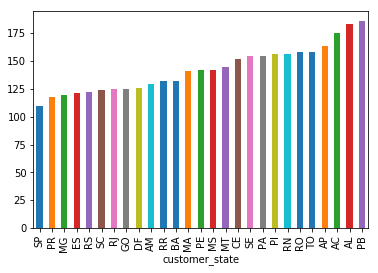

In [47]:
df.groupby(by=['customer_state'])['price'].mean().sort_values().plot(kind='bar')

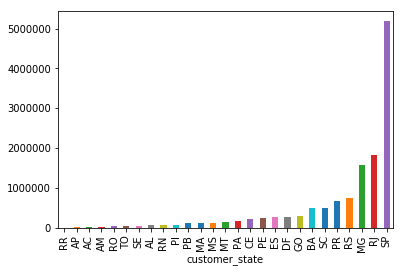

In [48]:
df.groupby(by=['customer_state'])['price'].sum().sort_values().plot(kind='bar')

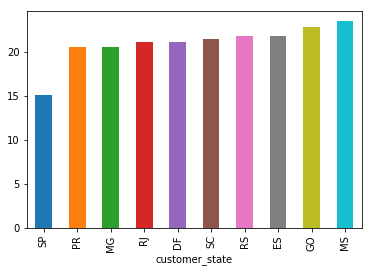

In [53]:
df.groupby(by=['customer_state'])['freight_value'].mean().sort_values().head(10).plot(kind='bar')

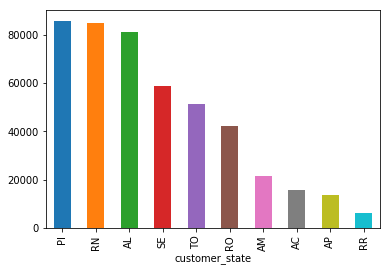

In [57]:
df.groupby(by=['customer_state'])['price'].sum().sort_values(ascending=False).tail(10).plot(kind='bar')

In [87]:
customer_freight = df.groupby(by=['customer_state'])['freight_value', 'customer_geolocation_lat', 'customer_geolocation_lng'].mean().sort_values(by='freight_value', ascending=False).reset_index()

In [88]:
customer_freight

,customer_state,freight_value,customer_geolocation_lat,customer_geolocation_lng
0,RR,43.704565,-23.093428,-47.110502
1,PB,42.835595,-22.288277,-46.851663
2,AC,40.019551,-22.487601,-47.282544
3,RO,39.704232,-22.770272,-47.115148
4,TO,39.624938,-22.412147,-47.079471
5,PI,39.337505,-22.341223,-46.666712
6,MA,38.135933,-22.128138,-46.832092
7,SE,36.454503,-22.103836,-46.410838
8,AL,35.822009,-22.072328,-46.865179
9,PA,35.207855,-22.562384,-46.960650


In [86]:
# import the library
import folium
import pandas as pd

# Make an empty map
m = folium.Map(location=[20,0], tiles="Mapbox Bright", zoom_start=2)

# I can add circle one by one on the map
for i in range(0, len(customer_freight.head(10))):
    folium.Circle(
        location=[customer_freight.iloc[i]['customer_geolocation_lat'], customer_freight.iloc[i]['customer_geolocation_lng']]
        , radius=customer_freight.iloc[i]['freight_value'] * 100
        , color='crimson'
        , fill=True
        , fill_color='crimson'
    ).add_to(m)

# Save it as html
m

In [83]:
to_geocode(customer_freight)